# Preamble

In [544]:
import numpy as np
import os
import itertools
import matplotlib.pyplot as plt
import xarray as xr
import xarray_class_accessors as xca
from importlib import reload
import cartopy.crs as ccrs
import matplotlib.ticker as mticker

In [76]:
ROOT_DIR = '/g/data/w40/ab2313/longrunmip'

In [77]:
LOESS_ROOT = os.path.join(ROOT_DIR, 'loess')
LOESS_ROOT

'/g/data/w40/ab2313/longrunmip/loess'

In [102]:
os.listdir(LOESS_ROOT)

['tas_mon_CCSM3_control_1530_loess.nc', 'tas_mon_CCSM3_abrupt4x_2120.nc']

# Control
THe SN for the piControl is get the stable/unstable bounds for each gridcell.

In [79]:
control = xr.open_dataset(os.path.join(ROOT_DIR,'tas_mon_CCSM3_control_1530.nc' )).tas

control = control.correct_data.apply_corrections()

control = control.resample(time='Y').mean()
control 

Testing months in each year...
Inital time length: 18360
- First year removed: 11 month(s) in year 1
- Last year removed:  1 month(s) in year 1531

Data Correction complete - all years now have 12 months
Final time length: 18348


<xarray.DataArray 'tas' (time: 1529, lat: 48, lon: 96)>
array([[[235.86493, 235.50179, 235.13353, ..., 236.84892, 236.5406 ,
         236.21118],
        [238.37079, 237.22215, 236.04646, ..., 241.35016, 240.44713,
         239.43877],
        [239.8416 , 237.90228, 235.96063, ..., 245.24316, 243.58911,
         241.77766],
        ...,
        [263.8774 , 265.18118, 265.90146, ..., 260.20456, 261.0649 ,
         262.254  ],
        [259.6686 , 260.0328 , 260.38202, ..., 258.26068, 258.76355,
         259.19073],
        [257.916  , 258.03632, 258.14853, ..., 257.6398 , 257.74213,
         257.83652]],

       [[235.3564 , 235.00415, 234.61969, ..., 236.33803, 236.03725,
         235.70268],
        [238.57758, 237.47261, 236.32445, ..., 241.50392, 240.60963,
         239.63506],
        [240.41597, 238.6551 , 236.8991 , ..., 245.48674, 243.87451,
         242.17317],
...
        [261.66296, 262.09494, 261.9867 , ..., 257.4562 , 258.64508,
         260.29572],
        [255.53589, 255.74329, 255.88863, ..., 254.16583, 254.63136,
         255.0341 ],
        [254.41034, 254.4991 , 254.58026, ..., 254.20654, 254.28532,
         254.35356]],

       [[233.48418, 233.03755, 232.58012, ..., 234.77235, 234.35268,
         233.93048],
        [235.1908 , 233.85356, 232.4763 , ..., 238.80861, 237.67389,
         236.47026],
        [237.7293 , 235.61786, 233.48466, ..., 243.38203, 241.64429,
         239.75859],
        ...,
        [259.55725, 259.8377 , 259.89133, ..., 257.08185, 258.07437,
         258.9237 ],
        [254.2987 , 254.48146, 254.70123, ..., 253.26869, 253.6573 ,
         253.95363],
        [253.09596, 253.20906, 253.30907, ..., 252.81451, 252.92323,
         253.01819]]], dtype=float32)
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1530-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [80]:
loess_control = xr.open_dataset(os.path.join(LOESS_ROOT,'tas_mon_CCSM3_control_1530_loess.nc' )).tas
loess_control

<xarray.DataArray 'tas' (time: 1529, lat: 48, lon: 96)>
[7045632 values with dtype=float64]
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1530-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
Attributes:
    history:  Modified by Alex Borowiak on 2021/08/03
    stats:    loess detrended data

In [517]:
control_anom = control.clima.anomalies(start = control.time.dt.year.values[0], 
                                          end = control.time.dt.year.values[-1])
control_anom

<xarray.DataArray 'tas' (time: 1529, lat: 48, lon: 96)>
dask.array<xarray-<this-array>, shape=(1529, 48, 96), dtype=float32, chunksize=(8, 48, 96), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1530-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [81]:
control_signal = control_anom.sn.signal_grad() # Anomalies not used origonally
control_signal

<xarray.DataArray 'signal' (time: 1469, lat: 48, lon: 96)>
array([[[-0.4314462 , -0.44632657, -0.45654445, ..., -0.40172533,
         -0.41376943, -0.42438241],
        [-0.4512017 , -0.49057735, -0.53319072, ..., -0.36199055,
         -0.38299817, -0.41418762],
        [-0.42741173, -0.49312178, -0.54904864, ..., -0.2665547 ,
         -0.29928692, -0.3525936 ],
        ...,
        [ 5.72508058,  5.90008131,  5.66681647, ...,  3.26855198,
          4.1358047 ,  5.01950994],
        [ 2.60426601,  2.71302776,  2.78373969, ...,  1.90076771,
          2.13237551,  2.36659762],
        [ 1.35154739,  1.39645391,  1.42716197, ...,  1.26962866,
          1.30384418,  1.33189264]],

       [[-0.30550803, -0.32070687, -0.33119325, ..., -0.27736846,
         -0.28886994, -0.29884319],
        [-0.31111362, -0.35666784, -0.40626856, ..., -0.21706494,
         -0.23647525, -0.27205102],
        [-0.29353209, -0.38362629, -0.46713739, ..., -0.08895648,
         -0.12845769, -0.19768903],
...
        [ 1.75522402,  1.7148403 ,  1.58892901, ...,  1.23728657,
          1.36545838,  1.59238114],
        [ 0.59083281,  0.57138519,  0.53487303, ...,  0.45189928,
          0.50965286,  0.55208563],
        [ 0.19346909,  0.20277183,  0.20552919, ...,  0.16591428,
          0.17855308,  0.18868802]],

       [[ 0.2731432 ,  0.26235854,  0.2468592 , ...,  0.32831032,
          0.31157374,  0.29431418],
        [ 0.4994464 ,  0.44779387,  0.39277856, ...,  0.60460141,
          0.57523503,  0.54352333],
        [ 0.69215777,  0.6756608 ,  0.64745483, ...,  0.70068783,
          0.70630193,  0.70208184],
        ...,
        [ 1.37704458,  1.29954312,  1.16040364, ...,  1.02898077,
          1.10988307,  1.27614293],
        [ 0.33123484,  0.29806159,  0.25435451, ...,  0.26422414,
          0.29724303,  0.31485822],
        [ 0.02027637,  0.02184576,  0.01691107, ...,  0.01318738,
          0.01911449,  0.02199929]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1470-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [82]:
control_noise = loess_control.sn.noise_grad()
control_noise

<xarray.DataArray 'noise' (time: 1469, lat: 48, lon: 96)>
array([[[0.86847721, 0.86849208, 0.87006587, ..., 0.87007624,
         0.86906773, 0.86801151],
        [0.8275722 , 0.83115343, 0.83598663, ..., 0.83428795,
         0.83017444, 0.8263911 ],
        [0.7700978 , 0.79245702, 0.81640932, ..., 0.77480151,
         0.7641177 , 0.7613571 ],
        ...,
        [2.69462179, 2.85728432, 2.85037657, ..., 1.7593971 ,
         2.04084032, 2.36896872],
        [1.71333056, 1.7658477 , 1.80543817, ..., 1.49310018,
         1.55931951, 1.6342738 ],
        [1.2775504 , 1.29001909, 1.29973754, ..., 1.25708015,
         1.26532433, 1.272511  ]],

       [[0.84751029, 0.84725144, 0.84858345, ..., 0.85048798,
         0.84894365, 0.847466  ],
        [0.80684402, 0.81101147, 0.81682899, ..., 0.81696226,
         0.81094416, 0.80626162],
        [0.7628262 , 0.78613847, 0.8116232 , ..., 0.76942914,
         0.75661141, 0.75293084],
...
        [2.13671329, 2.07959397, 1.95886949, ..., 1.54465329,
         1.82476617, 2.03676605],
        [1.34640931, 1.35466807, 1.34705033, ..., 1.23821112,
         1.28222162, 1.31942033],
        [0.90208576, 0.91358878, 0.92036057, ..., 0.86602214,
         0.88129955, 0.89282285]],

       [[0.77346012, 0.78021515, 0.78484943, ..., 0.75939703,
         0.76354075, 0.76835296],
        [0.73495057, 0.74057637, 0.75088508, ..., 0.72299905,
         0.72288379, 0.72637233],
        [0.72605968, 0.73847878, 0.75310968, ..., 0.72832523,
         0.71998789, 0.71906382],
        ...,
        [2.13953246, 2.08480941, 1.96426588, ..., 1.55136543,
         1.8273113 , 2.03817346],
        [1.38698566, 1.39528181, 1.38590479, ..., 1.27348586,
         1.32060784, 1.35967856],
        [0.94657369, 0.95785295, 0.96416241, ..., 0.91008165,
         0.92556611, 0.93730274]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1470-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
Attributes:
    history:  Modified by Alex Borowiak on 2021/08/03
    stats:    loess detrended data

In [83]:
control_sn = control_signal/control_noise
control_sn

<xarray.DataArray (time: 1469, lat: 48, lon: 96)>
array([[[-0.49678471, -0.51390977, -0.524724  , ..., -0.46171279,
         -0.47610723, -0.48891334],
        [-0.54521128, -0.59023681, -0.63779815, ..., -0.43389162,
         -0.46134661, -0.50120048],
        [-0.55500967, -0.62226944, -0.67251638, ..., -0.34402967,
         -0.39167647, -0.46311199],
        ...,
        [ 2.12463233,  2.06492622,  1.98809397, ...,  1.8577682 ,
          2.02652047,  2.11885868],
        [ 1.52000208,  1.53638831,  1.54186376, ...,  1.27303428,
          1.3675039 ,  1.44810351],
        [ 1.05792099,  1.08250638,  1.09803859, ...,  1.00998226,
          1.03044267,  1.04666493]],

       [[-0.36047707, -0.3785262 , -0.39028954, ..., -0.32612861,
         -0.34026987, -0.35263148],
        [-0.38559326, -0.43978151, -0.49737284, ..., -0.26569763,
         -0.29160485, -0.33742276],
        [-0.38479551, -0.48798819, -0.57555944, ..., -0.1156136 ,
         -0.16978027, -0.26255935],
...
        [ 0.82145978,  0.82460342,  0.81114593, ...,  0.80101249,
          0.74829225,  0.78181838],
        [ 0.4388211 ,  0.42178981,  0.39706981, ...,  0.36496141,
          0.39747642,  0.41843044],
        [ 0.21446862,  0.22195088,  0.22331378, ...,  0.19158203,
          0.20260203,  0.2113387 ]],

       [[ 0.35314452,  0.33626434,  0.31453065, ...,  0.43233027,
          0.40806432,  0.38304555],
        [ 0.67956461,  0.6046559 ,  0.52308744, ...,  0.83624095,
          0.79575036,  0.74827098],
        [ 0.953307  ,  0.91493598,  0.85970856, ...,  0.96205348,
          0.9809914 ,  0.97638321],
        ...,
        [ 0.64361939,  0.62333905,  0.59075691, ...,  0.66327427,
          0.60738587,  0.62612087],
        [ 0.23881634,  0.21362107,  0.18352957, ...,  0.20748102,
          0.22508047,  0.23156813],
        [ 0.02142081,  0.02280701,  0.01753965, ...,  0.01449033,
          0.02065167,  0.02347084]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1470-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [321]:
control_sn_ubound = control_sn.reduce(np.nanpercentile, q=90, dim='time')
control_sn_lbound = control_sn.reduce(np.nanpercentile, q=10, dim='time')

In [74]:
# loess_control = loess_control.sel(lat=slice(-50,-30), lon=slice(135,155))
# control = control.sel(lat=slice(-50,-30), lon=slice(135,155))

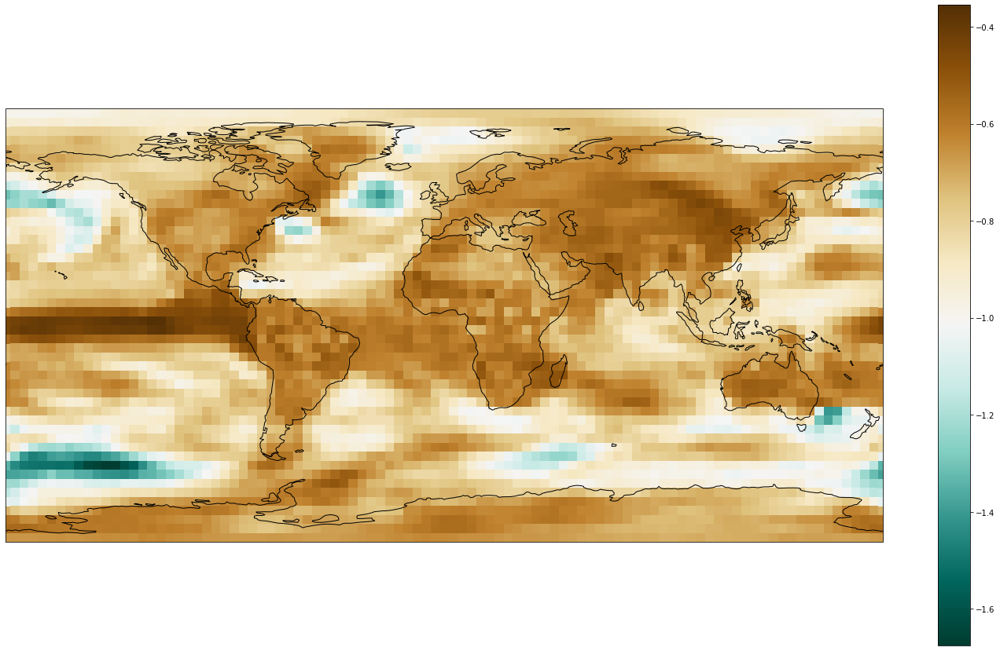

In [325]:
fig = plt.figure(figsize = (25,15))

ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
control_sn_lbound.plot(ax=ax, cmap='BrBG_r')
ax.coastlines()

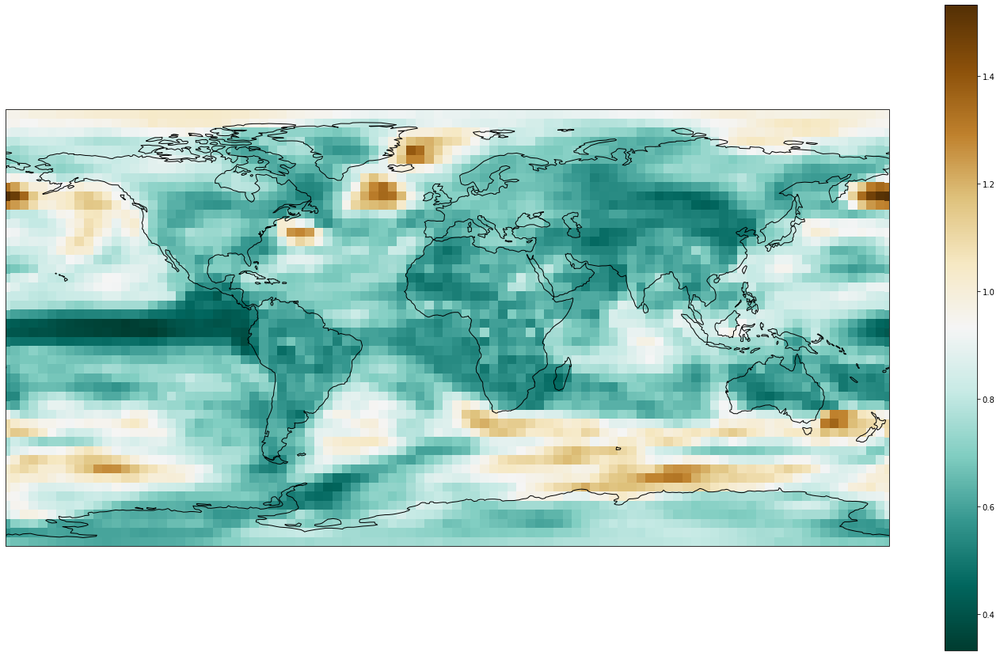

In [324]:
fig = plt.figure(figsize = (25,15))

ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
control_sn_ubound.plot(ax=ax, cmap='BrBG_r')
ax.coastlines()

# QuadCO2

In [100]:
abrupt = xr.open_dataset(os.path.join(ROOT_DIR,'tas_mon_CCSM3_abrupt4x_2120.nc' )).tas

abrupt = abrupt.correct_data.apply_corrections()

abrupt = abrupt.resample(time='Y').mean()
abrupt 

Testing months in each year...
Inital time length: 25440
- First year removed: 11 month(s) in year 1
- Last year removed:  1 month(s) in year 2121
- Incorrect year detected and time overridden

Data Correction complete - all years now have 12 months
Final time length: 25428


<xarray.DataArray 'tas' (time: 2119, lat: 48, lon: 96)>
array([[[238.17262, 237.81415, 237.4554 , ..., 239.1385 , 238.8279 ,
         238.50989],
        [240.75873, 239.70117, 238.63087, ..., 243.5872 , 242.70825,
         241.76225],
        [242.45258, 240.6974 , 238.99084, ..., 247.44733, 245.88509,
         244.20746],
        ...,
        [262.82187, 264.01248, 264.89276, ..., 261.59412, 261.6085 ,
         262.00278],
        [260.01486, 260.19543, 260.38647, ..., 259.27866, 259.56528,
         259.77042],
        [259.1821 , 259.24893, 259.3114 , ..., 259.05426, 259.10065,
         259.13828]],

       [[236.11565, 235.787  , 235.43633, ..., 237.04193, 236.75072,
         236.44154],
        [238.8268 , 237.8432 , 236.84479, ..., 241.58934, 240.73964,
         239.8091 ],
        [240.69069, 239.06734, 237.50099, ..., 245.6093 , 244.02362,
         242.36903],
...
        [271.12576, 271.3906 , 271.444  , ..., 268.50244, 269.7305 ,
         270.5875 ],
        [267.8196 , 267.98868, 268.12393, ..., 266.86157, 267.26968,
         267.56277],
        [266.82373, 266.8773 , 266.92075, ..., 266.59106, 266.68405,
         266.76785]],

       [[241.1106 , 240.7738 , 240.43372, ..., 242.04884, 241.74658,
         241.43355],
        [244.29964, 243.29948, 242.2906 , ..., 247.20032, 246.26624,
         245.28731],
        [246.07825, 244.34969, 242.72267, ..., 251.67986, 249.80945,
         247.9226 ],
        ...,
        [271.35434, 271.63284, 271.68005, ..., 269.0222 , 269.98453,
         270.77737],
        [267.91116, 268.19626, 268.4202 , ..., 266.73145, 267.15375,
         267.52435],
        [267.3329 , 267.40015, 267.4672 , ..., 267.05527, 267.15005,
         267.25082]]], dtype=float32)
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [511]:
abrupt_anom = abrupt.clima.anomalies(start = control.time.dt.year.values[0], 
                                          end = control.time.dt.year.values[-1],
                            historical = control)

Using historical dataset


In [512]:
abrupt_anom 

<xarray.DataArray 'tas' (time: 2119, lat: 48, lon: 96)>
dask.array<xarray-<this-array>, shape=(2119, 48, 96), dtype=float32, chunksize=(8, 48, 96), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [506]:
loess_abrupt

<xarray.DataArray 'tas' (time: 2119, lat: 48, lon: 96)>
array([[[ 1.540622,  1.531903, ...,  1.530187,  1.537988],
        [ 1.227832,  1.211148, ...,  1.253056,  1.240639],
        ...,
        [-2.031328, -2.046194, ..., -1.964661, -2.013323],
        [-2.324933, -2.310787, ..., -2.294965, -2.31927 ]],

       [[-0.582131, -0.56109 , ..., -0.612554, -0.596022],
        [-0.764214, -0.706278, ..., -0.777589, -0.773542],
        ...,
        [-1.000243, -1.077421, ..., -0.859244, -0.915988],
        [-0.900474, -0.907215, ..., -0.872145, -0.888172]],

       ...,

       [[-0.052262, -0.066861, ..., -0.043171, -0.051959],
        [-0.394373, -0.420489, ..., -0.331736, -0.363011],
        ...,
        [-0.921475, -0.974722, ..., -0.737918, -0.82582 ],
        [-0.84765 , -0.86966 , ..., -0.800102, -0.821045]],

       [[-1.194193, -1.193503, ..., -1.192528, -1.196836],
        [-1.199784, -1.210328, ..., -1.122646, -1.171499],
        ...,
        [-0.816691, -0.749796, ..., -0.845682, -0.85417 ],
        [-0.322563, -0.330067, ..., -0.31986 , -0.322902]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
Attributes:
    history:  Modified by Alex Borowiak on 2021/08/03
    stats:    loess detrended data

In [103]:
loess_abrupt = xr.open_dataset(os.path.join(LOESS_ROOT,'tas_mon_CCSM3_abrupt4x_2120.nc' )).tas
loess_abrupt

In [104]:
loess_abrupt

<xarray.DataArray 'tas' (time: 2119, lat: 48, lon: 96)>
[9764352 values with dtype=float64]
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
Attributes:
    history:  Modified by Alex Borowiak on 2021/08/03
    stats:    loess detrended data

In [106]:
%%time
abrupt_signal = abrupt_anom.sn.signal_grad()
abrupt_noise = loess_abrupt.sn.noise_grad()
abrupt_sn = abrupt_signal/abrupt_noise
abrupt_sn

CPU times: user 16min 36s, sys: 1.45 s, total: 16min 38s
Wall time: 16min 47s


<xarray.DataArray (time: 2059, lat: 48, lon: 96)>
array([[[ 2.35174088e+00,  2.34825874e+00,  2.34935483e+00, ...,
          2.36772085e+00,  2.35878573e+00,  2.35750055e+00],
        [ 2.48310123e+00,  2.43532423e+00,  2.38271732e+00, ...,
          2.57074122e+00,  2.55281268e+00,  2.52334428e+00],
        [ 1.98135958e+00,  1.80408842e+00,  1.65876558e+00, ...,
          2.47253092e+00,  2.34501405e+00,  2.17298353e+00],
        ...,
        [ 6.00319513e+00,  5.66937090e+00,  5.33247216e+00, ...,
          5.88787790e+00,  6.03334596e+00,  6.07647911e+00],
        [ 5.60611088e+00,  5.59092395e+00,  5.51416825e+00, ...,
          5.28612310e+00,  5.42382342e+00,  5.52525600e+00],
        [ 5.06862943e+00,  5.07743229e+00,  5.07210050e+00, ...,
          5.08628258e+00,  5.08593014e+00,  5.07594069e+00]],

       [[ 2.54543456e+00,  2.53855921e+00,  2.54021335e+00, ...,
          2.56661024e+00,  2.55470368e+00,  2.55163570e+00],
        [ 2.57246465e+00,  2.51462185e+00,  2.45527339e+00, ...,
          2.68801255e+00,  2.65887144e+00,  2.62100058e+00],
        [ 2.00928788e+00,  1.81696389e+00,  1.67119258e+00, ...,
          2.55868112e+00,  2.41931266e+00,  2.22314860e+00],
...
        [-5.70304683e-01, -1.28010111e+00, -1.72152015e+00, ...,
          3.95783454e-01,  4.65347246e-01,  1.67271927e-01],
        [-1.36882185e+00, -1.55067853e+00, -1.72435601e+00, ...,
         -9.58641046e-01, -1.06675867e+00, -1.20376298e+00],
        [-1.46931829e+00, -1.49230254e+00, -1.52467641e+00, ...,
         -1.39919206e+00, -1.41956689e+00, -1.44696329e+00]],

       [[-4.35396456e-01, -4.27822849e-01, -4.31630946e-01, ...,
         -4.79960154e-01, -4.60077732e-01, -4.50137053e-01],
        [ 2.68149388e-02,  5.13861184e-02,  7.10416872e-02, ...,
         -9.91066490e-02, -5.01767446e-02, -8.68887429e-03],
        [ 3.88094292e-01,  3.84428380e-01,  3.59658030e-01, ...,
          2.16882505e-01,  2.89641441e-01,  3.56496482e-01],
        ...,
        [-6.36282786e-01, -1.33412708e+00, -1.76992081e+00, ...,
          3.54089505e-01,  4.14702567e-01,  9.99186075e-02],
        [-1.44517303e+00, -1.62486646e+00, -1.79649791e+00, ...,
         -1.04532286e+00, -1.14754761e+00, -1.28125236e+00],
        [-1.52969649e+00, -1.55464315e+00, -1.58879624e+00, ...,
         -1.45707877e+00, -1.47818644e+00, -1.50651213e+00]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2060-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [193]:
control_sn_bound

<xarray.DataArray (lat: 48, lon: 96)>
array([[0.74437762, 0.74088978, 0.74561039, ..., 0.74511916, 0.75316354,
        0.75498767],
       [0.69973391, 0.68856549, 0.67764723, ..., 0.71853618, 0.71641799,
        0.70894191],
       [0.66942938, 0.67456769, 0.68774263, ..., 0.76970495, 0.72385846,
        0.71334894],
       ...,
       [1.04424886, 1.04800846, 1.00547923, ..., 0.99566225, 0.9956634 ,
        1.01297614],
       [0.91357131, 0.89379079, 0.88452172, ..., 0.88419864, 0.89422951,
        0.90840828],
       [0.9043163 , 0.90261999, 0.90373826, ..., 0.8932525 , 0.89670379,
        0.91036893]])
Coordinates:
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [334]:
abrupt_sn_increasing_unstable = abrupt_sn.where(abrupt_sn > control_sn_ubound)
abrupt_sn_decreasing_unstable = abrupt_sn.where(abrupt_sn < control_sn_lbound)


In [494]:
abrupt_sn_stable = abrupt_sn.where(
    np.logical_and(
                        abrupt_sn <= control_sn_ubound,
                        abrupt_sn >= control_sn_lbound
                            )
                                  )


In [495]:
abrupt_sn_stable

<xarray.DataArray (time: 2059, lat: 48, lon: 96)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [-0.57030468,         nan,         nan, ...,  0.39578345,
          0.46534725,  0.16727193],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]],

       [[-0.43539646, -0.42782285, -0.43163095, ..., -0.47996015,
         -0.46007773, -0.45013705],
        [ 0.02681494,  0.05138612,  0.07104169, ..., -0.09910665,
         -0.05017674, -0.00868887],
        [ 0.38809429,  0.38442838,  0.35965803, ...,  0.21688251,
          0.28964144,  0.35649648],
        ...,
        [-0.63628279,         nan,         nan, ...,  0.3540895 ,
          0.41470257,  0.09991861],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]]])
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2060-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

## Plots Samples

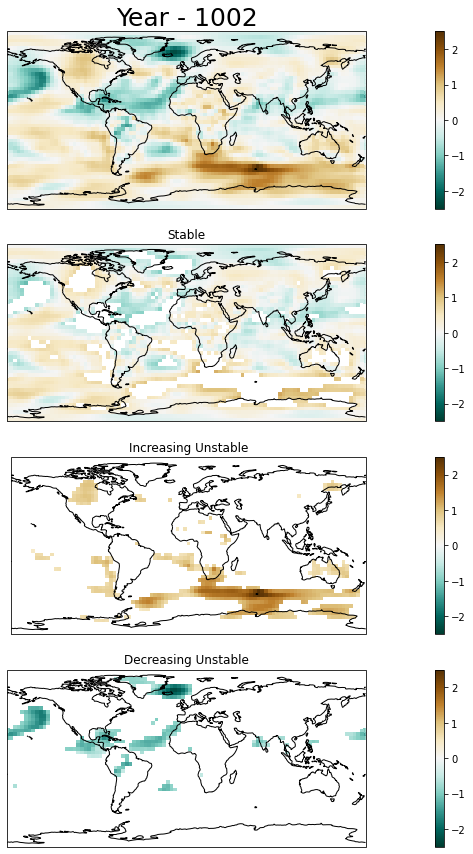

In [338]:
fig = plt.figure(figsize = (25,15))
time_index = 1000


ax = fig.add_subplot(411, projection=ccrs.PlateCarree())
plot1 = abrupt_sn.isel(time = time_index).plot(ax=ax, cmap='BrBG_r')
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title(f'Year - {time_val.year}', fontsize = 25)


ax = fig.add_subplot(412, projection=ccrs.PlateCarree())
abrupt_sn_stable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Stable')


ax = fig.add_subplot(413, projection=ccrs.PlateCarree())
abrupt_sn_increasing_unstable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Increasing Unstable');



ax = fig.add_subplot(414, projection=ccrs.PlateCarree())
abrupt_sn_decreasing_unstable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Decreasing Unstable');



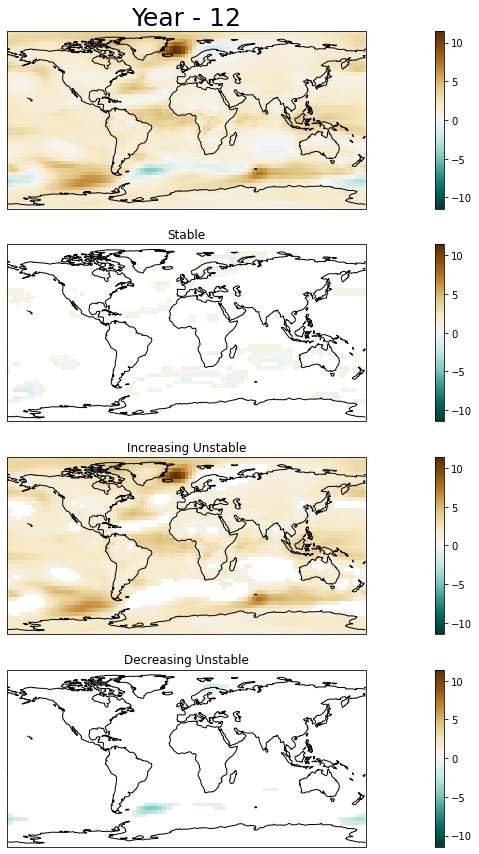

In [339]:
fig = plt.figure(figsize = (25,15))
time_index = 10


ax = fig.add_subplot(411, projection=ccrs.PlateCarree())
plot1 = abrupt_sn.isel(time = time_index).plot(ax=ax, cmap='BrBG_r')
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title(f'Year - {time_val.year}', fontsize = 25)


ax = fig.add_subplot(412, projection=ccrs.PlateCarree())
abrupt_sn_stable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Stable')


ax = fig.add_subplot(413, projection=ccrs.PlateCarree())
abrupt_sn_increasing_unstable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Increasing Unstable');



ax = fig.add_subplot(414, projection=ccrs.PlateCarree())
abrupt_sn_decreasing_unstable.isel(time = time_index).plot(ax=ax, cmap='BrBG_r', 
                                              vmin = plot1.get_clim()[0], vmax = plot1.get_clim()[1])
ax.coastlines()
time_val = abrupt_sn.time.values[time_index]
ax.set_title('Decreasing Unstable');



# Consect and First Instance

In [499]:
reload(xca)

/home/563/ab2313/Documents/PhD/init/xarray_class_accessors.py:10: AccessorRegistrationWarning: registration of accessor <class 'xarray_class_accessors.CorrectData'> under name 'correct_data' for type <class 'xarray.core.dataarray.DataArray'> is overriding a preexisting attribute with the same name.
  class CorrectData:
/home/563/ab2313/Documents/PhD/init/xarray_class_accessors.py:56: AccessorRegistrationWarning: registration of accessor <class 'xarray_class_accessors.ClimatologyFunction'> under name 'clima' for type <class 'xarray.core.dataarray.DataArray'> is overriding a preexisting attribute with the same name.
  class ClimatologyFunction:
/home/563/ab2313/Documents/PhD/init/xarray_class_accessors.py:135: AccessorRegistrationWarning: registration of accessor <class 'xarray_class_accessors.SignalToNoise'> under name 'sn' for type <class 'xarray.core.dataarray.DataArray'> is overriding a preexisting attribute with the same name.
  class SignalToNoise:


<module 'xarray_class_accessors' from '/home/563/ab2313/Documents/PhD/init/xarray_class_accessors.py'>

In [501]:
stable_ds = abrupt_sn_stable.sn.calculate_consecutive_metrics()

In [502]:
stable_ds

<xarray.Dataset>
Dimensions:              (lat: 48, lon: 96)
Coordinates:
    time                 object 0002-12-31 00:00:00
  * lat                  (lat) float64 -87.16 -83.48 -79.78 ... 83.48 87.16
  * lon                  (lon) float64 0.0 3.75 7.5 11.25 ... 348.8 352.5 356.2
Data variables:
    first_stable         (lat, lon) float64 18.0 18.0 18.0 ... 40.0 40.0 40.0
    average_length       (lat, lon) float64 17.1 16.33 17.0 ... 18.6 18.26 19.37
    number_periods       (lat, lon) float64 90.0 94.0 91.0 ... 68.0 69.0 65.0
    total_time_stable    (lat, lon) float64 1.539e+03 1.535e+03 ... 1.259e+03
    percent_time_stable  (lat, lon) float64 74.75 74.55 75.13 ... 61.19 61.15

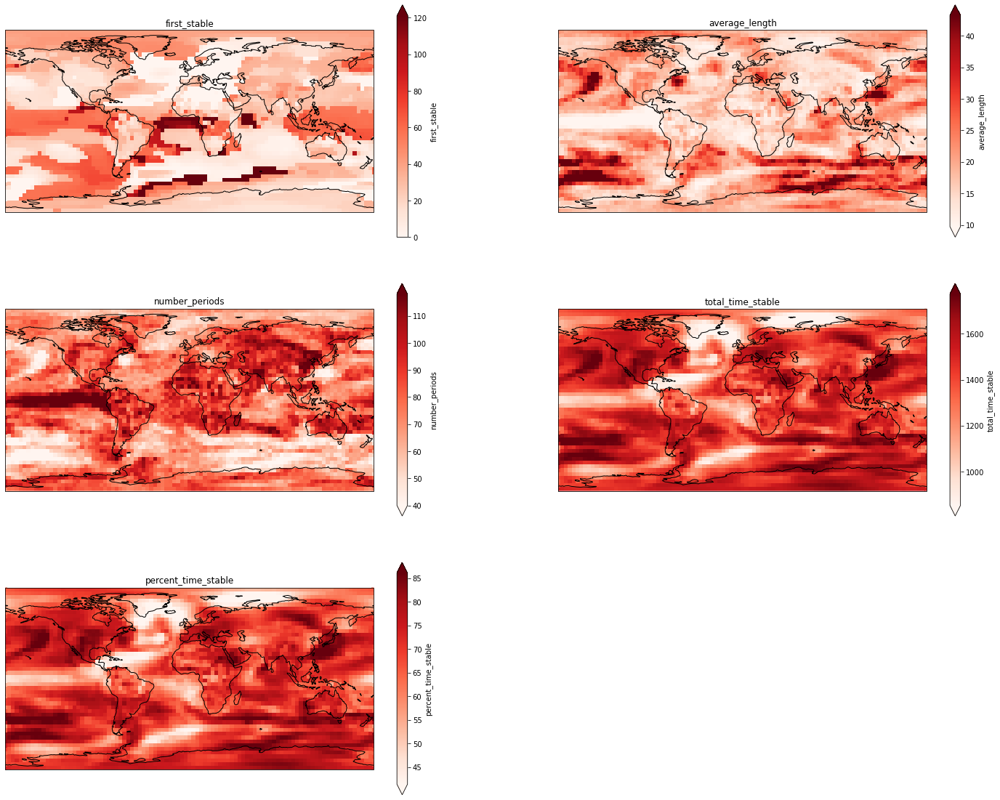

In [503]:
data_vars = list(stable_ds.data_vars)

figsize = (25, 4 * len(data_vars))
num_plots= len(data_vars)

fig = plt.figure(figsize=figsize)

for pnum, var in enumerate(data_vars):
    ax = fig.add_subplot(int(num_plots/2) + 1, 2, pnum + 1, projection=ccrs.PlateCarree())
    
    stable_ds[var].plot(ax=ax, cmap='Reds', robust=True)
    ax.coastlines()

    ax.set_title(var)

# Global Mean

## Control Bounds

In [551]:
control_anom

<xarray.DataArray 'tas' (time: 1529, lat: 48, lon: 96)>
dask.array<xarray-<this-array>, shape=(1529, 48, 96), dtype=float32, chunksize=(8, 48, 96), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1530-12-31 00:00:00
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

In [558]:
control_anom_smean = control_anom.clima.space_mean()

In [564]:
control_anom_smean.sn.signal_grad()
control_anom_smean_loess = control_anom_smean.sn.loess_grid()
control_anom_smean_noise = control_anom_smean_loess.sn.noise_grad()

control_anom_smean_sn = control_anom_smean_signal/control_anom_smean_noise

In [567]:
control_anom_smean_sn

<xarray.DataArray (time: 1469)>
dask.array<truediv, shape=(1469,), dtype=float64, chunksize=(64,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 1470-12-31 00:00:00

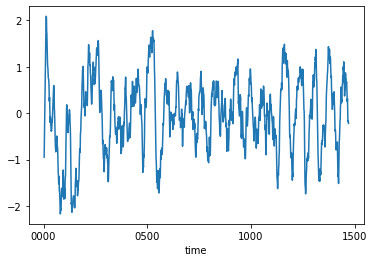

In [566]:
control_anom_smean_sn.plot()

In [570]:
control_smean_ubound = control_anom_smean_sn.reduce(np.nanpercentile, q=90, dim='time')
control_smean_lbound = control_anom_smean_sn.reduce(np.nanpercentile, q=10, dim='time')

/g/data3/hh5/public/apps/miniconda3/envs/analysis3-21.04/lib/python3.8/site-packages/dask/array/core.py:1514: FutureWarning: The `numpy.nanpercentile` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(
/g/data3/hh5/public/apps/miniconda3/envs/analysis3-21.04/lib/python3.8/site-packages/dask/array/core.py:1514: FutureWarning: The `numpy.nanpercentile` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(


In [573]:
print(control_smean_lbound.values, control_smean_ubound.values)

-1.1509432120534802 0.9395255167174165


## Abrupt Values

In [528]:
abrupt_anom_smean = abrupt_anom.clima.space_mean()
abrupt_anom_smean

<xarray.DataArray 'tas' (time: 2119)>
dask.array<truediv, shape=(2119,), dtype=float64, chunksize=(8,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00

In [529]:
abrupt_anom_smean_signal = abrupt_anom_smean.sn.signal_grad()
abrupt_anom_smean_signal

<xarray.DataArray 'signal' (time: 2059)>
dask.array<getitem, shape=(2059,), dtype=float64, chunksize=(64,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2060-12-31 00:00:00

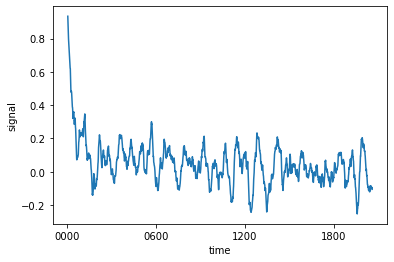

In [530]:
abrupt_anom_smean_signal.plot()

In [533]:
abrupt_anom_smean_loess = abrupt_anom_smean.sn.loess_grid()
abrupt_anom_smean_loess

<xarray.DataArray 'tas' (time: 2119)>
dask.array<sub, shape=(2119,), dtype=float64, chunksize=(8,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2120-12-31 00:00:00

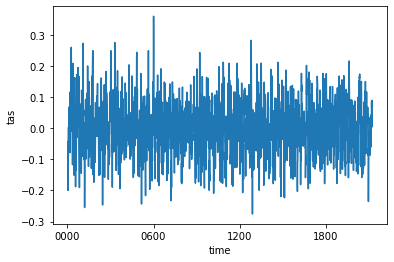

In [534]:
abrupt_anom_smean_loess.plot()

In [537]:
abrupt_anom_smean_noise = abrupt_anom_smean_loess.sn.noise_grad()
abrupt_anom_smean_noise

<xarray.DataArray 'noise' (time: 2059)>
dask.array<getitem, shape=(2059,), dtype=float64, chunksize=(64,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2060-12-31 00:00:00

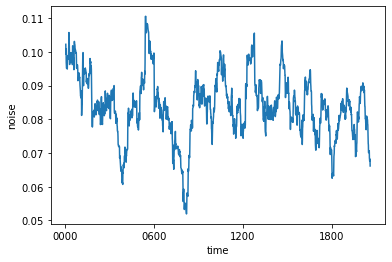

In [538]:
abrupt_anom_smean_noise.plot()

In [540]:
abrupt_anom_smean_sn = abrupt_anom_smean_signal/abrupt_anom_smean_noise
abrupt_anom_smean_sn

<xarray.DataArray (time: 2059)>
dask.array<truediv, shape=(2059,), dtype=float64, chunksize=(64,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0002-12-31 00:00:00 ... 2060-12-31 00:00:00

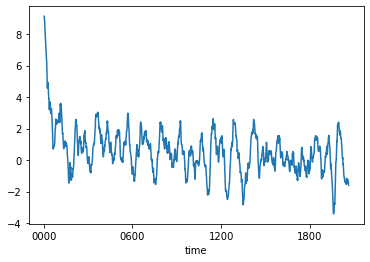

In [541]:
abrupt_anom_smean_sn.plot()

(-728906.0, 44164.0)

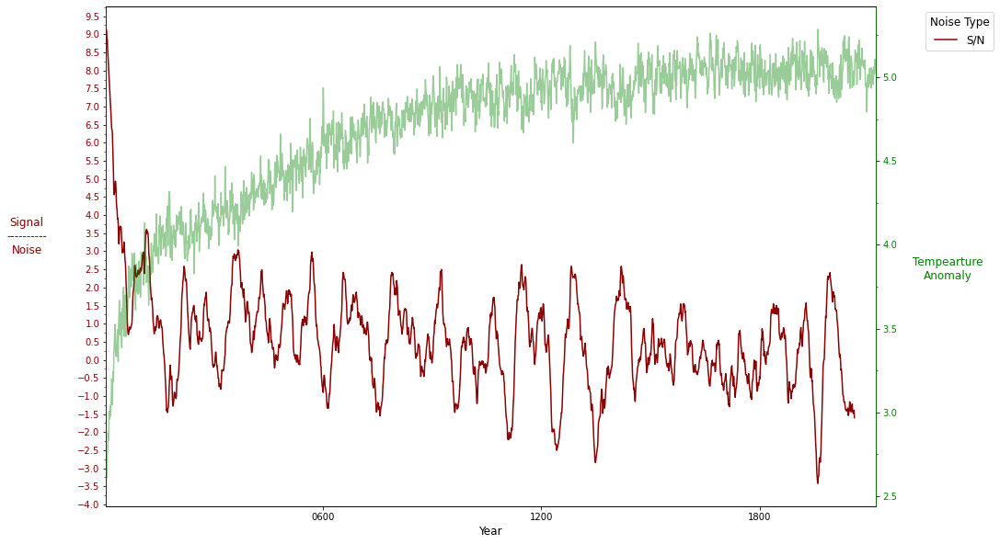

In [549]:
fig = plt.figure(figsize=  (15,10))
ax = fig.add_subplot(111)

time =  abrupt_anom_smean_sn.time.values

ax.plot(time,abrupt_anom_smean_sn.values, label = 'S/N', c = 'darkred')

c0 = plt.gca().lines[0].get_color()
ax.tick_params(axis = 'y', labelcolor = c0)
ax.set_ylabel('Signal\n----------\nNoise', fontsize = 12, color = c0, rotation = 0, labelpad = 55);

leg = ax.legend(ncol = 1, fontsize = 12, bbox_to_anchor = [1.16, 1])
leg.set_title('Noise Type')
leg.get_title().set_fontsize('12')

ax.yaxis.set_major_locator(mticker.MultipleLocator(.5))
ax.yaxis.set_minor_locator(mticker.MultipleLocator(.25))

# Second y-axis: the temperature anomalies.

data2 = abrupt_anom_smean


ax2 = ax.twinx()

ax2.plot(data2.time.values, data2.values,
         color = 'green', alpha = 0.4, label  = 'Temp Anomaly')

c1 = plt.gca().lines[0].get_color()
ax2.tick_params(axis = 'y', labelcolor = c1)
ax2.spines['right'].set_color(c1)
ax2.spines['left'].set_color(c0)
ax2.set_ylabel('Tempearture\nAnomaly', fontsize = 12, color = c1, rotation = 0, labelpad = 55);
ax2.yaxis.set_major_locator(mticker.MultipleLocator(.5))
ax2.yaxis.set_minor_locator(mticker.MultipleLocator(.25))

ax2.set_xlim([time[0], time[-1]])
ax.set_xlabel('Year', fontsize = 12);
ax.set_xlim(data2.time.values[0], data2.time.values[-1])
# ax.grid(which = 'major', axis = 'both', linestyle = ':', alpha = 0.5, zorder = -100)

# ax.set_title(f'BEST Signal/Noise and Temperature Anomaly ({ROLL_PERIOD/MONTHS_IN_YEAR}Y Window)', size =

## Global Average Stable Bounds

# Animation Trials

In [151]:
ANIMATION_DIR = '/g/data/w40/ab2313/animation'

In [240]:
# os.mkdir(os.path.join(ANIMATION_DIR, 'animation'))

os.mkdir(os.path.join(ANIMATION_DIR,'raw_3'))

In [241]:
RAW_DIR = os.path.join(ANIMATION_DIR,'raw_3')
RAW_DIR

'/g/data/w40/ab2313/animation/raw_3'

In [247]:
vmax = abrupt_sn_unstable.reduce(np.nanpercentile, q=99).values
vmin = abrupt_sn_unstable.reduce(np.nanpercentile, q=1).values
print(vmax, vmin)

3.788778939059315 0.5329292289550803


In [283]:
time = abrupt_sn.time.values

total = 0
for t in time[::10]:
    fig = plt.figure(figsize = (25,15))
    ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
    
    abrupt_sn_unstable.sel(time = t).plot(ax=ax, cmap='copper_r', vmin=vmin, vmax=vmax, extend='both')
    ax.coastlines()
    
    time_val = t.year
    
    ax.annotate(str(time_val), xy=(0.003, 0.95), size = 30, xycoords = 'axes fraction', color='red',
               bbox = {'facecolor':'white'});
    ax.set_title(f'')
    fig.savefig(os.path.join(RAW_DIR, f'{time_val}.png'))
    print(f'{time_val}, ', end='')
    plt.close()

2, 12, 22, 32, 42, 52, 62, 72, 82, 92, 102, 112, 122, 132, 142, 152, 162, 172, 182, 192, 202, 212, 222, 232, 242, 252, 262, 272, 282, 292, 302, 312, 322, 332, 342, 352, 362, 372, 382, 392, 402, 412, 422, 432, 442, 452, 462, 472, 482, 492, 502, 512, 522, 532, 542, 552, 562, 572, 582, 592, 602, 612, 622, 632, 642, 652, 662, 672, 682, 692, 702, 712, 722, 732, 742, 752, 762, 772, 782, 792, 802, 812, 822, 832, 842, 852, 862, 872, 882, 892, 902, 912, 922, 932, 942, 952, 962, 972, 982, 992, 1002, 1012, 1022, 1032, 1042, 1052, 1062, 1072, 1082, 1092, 1102, 1112, 1122, 1132, 1142, 1152, 1162, 1172, 1182, 1192, 1202, 1212, 1222, 1232, 1242, 1252, 1262, 1272, 1282, 1292, 1302, 1312, 1322, 1332, 1342, 1352, 1362, 1372, 1382, 1392, 1402, 1412, 1422, 1432, 1442, 1452, 1462, 1472, 1482, 1492, 1502, 1512, 1522, 1532, 1542, 1552, 1562, 1572, 1582, 1592, 1602, 1612, 1622, 1632, 1642, 1652, 1662, 1672, 1682, 1692, 1702, 1712, 1722, 1732, 1742, 1752, 1762, 1772, 1782, 1792, 1802, 1812, 1822, 1832, 1842, 1

Text(0.5, 1.0, '')

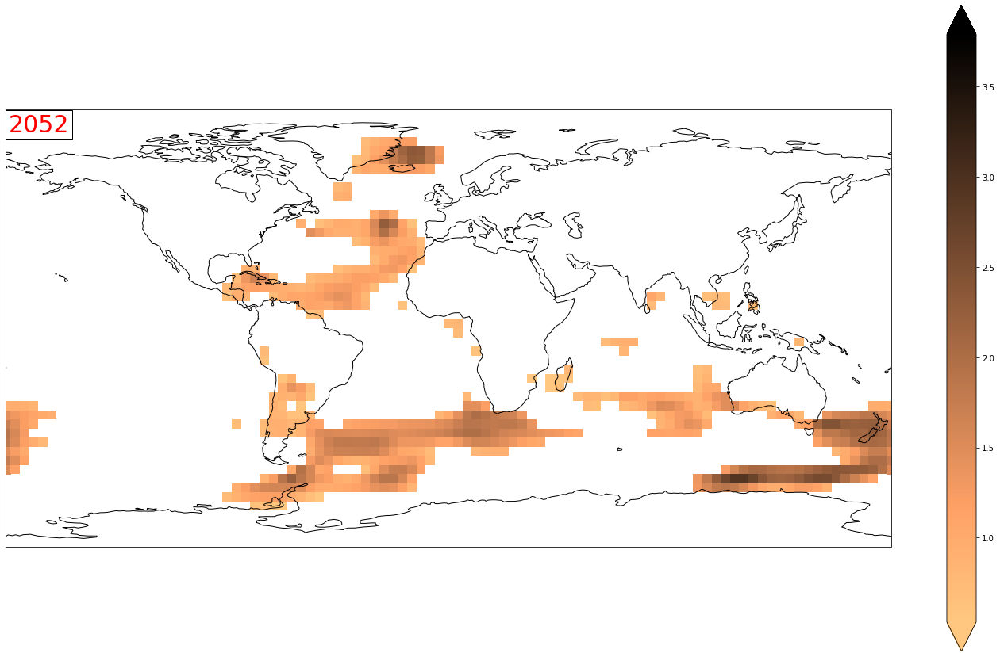

In [282]:
fig = plt.figure(figsize = (25,15))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

abrupt_sn_unstable.sel(time = t).plot(ax=ax, cmap='copper_r', vmin=vmin, vmax=vmax, extend='both')
ax.coastlines()

time_val = t.year

ax.annotate(str(time_val), xy=(0.003, 0.95), size = 30, xycoords = 'axes fraction', color='red',
           bbox = {'facecolor':'white'});
ax.set_title(f'')

In [287]:
# pyplot needed to plot the dataset, but animation only needed much further down.
from matplotlib import pyplot as plt, animation
%matplotlib inline

# This is needed to display graphics calculated outside of jupyter notebook
from IPython.display import HTML, display


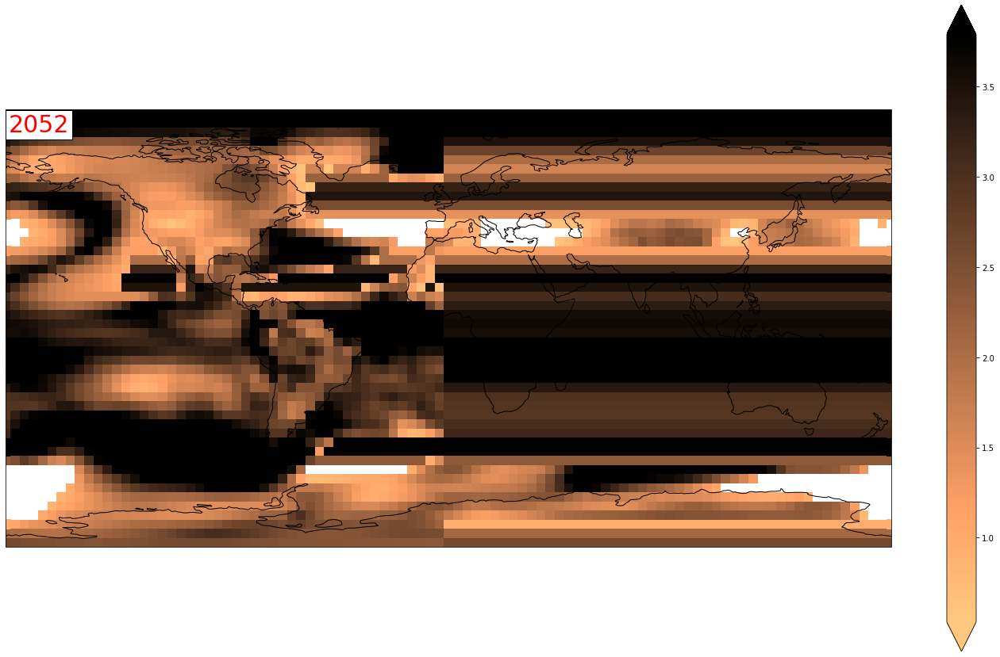

In [288]:
fig = plt.figure(figsize = (25,15))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

cax = abrupt_sn_unstable.isel(time = 0).plot(ax=ax, cmap='copper_r', vmin=vmin, vmax=vmax, extend='both')
ax.coastlines()

time_val = t.year

ax.annotate(str(time_val), xy=(0.003, 0.95), size = 30, xycoords = 'axes fraction', color='red',
           bbox = {'facecolor':'white'});
ax.set_title(f'');


# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    cax.set_array(abrupt_sn_unstable[frame,:,:].values.flatten())
#     ax.set_title("Time = " + str(tas.coords['time'].values[frame])[:13])

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=40,       # Could also be iterable or list
    interval=200     # ms between frames
)

In [289]:
HTML(ani.to_jshtml())

In [ ]:
# Get a handle on the figure and the axes
fig, ax = plt.subplots(figsize=(12,6))

# Plot the initial frame. 
cax = tas[0,:,:].plot(
    add_colorbar=True,
    cmap='coolwarm',
    vmin=-40, vmax=40,
    cbar_kwargs={
        'extend':'neither'
    }
)

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    cax.set_array(tas[frame,:,:].values.flatten())
    ax.set_title("Time = " + str(tas.coords['time'].values[frame])[:13])

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=40,       # Could also be iterable or list
    interval=200     # ms between frames
)

In [276]:
# RAW_DIR

# !convert /g/data/w40/ab2313/animation/raw_2/*png /g/data/w40/ab2313/animation/unstable_1.gif

# os.listdir(ANIMATION_DIR)

# !convert